# インポート

In [57]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
import pandas as pd
import pandas_profiling as pdp
import numpy as np

import lightgbm as lgb

#回帰の可視化
#関数の処理で必要なライブラリ
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer

from sklearn.ensemble import (
    ExtraTreesRegressor,
    GradientBoostingRegressor,
    RandomForestRegressor,
)

import shap
# import xgboost

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)

import warnings
warnings.filterwarnings('ignore')

# 関数

In [58]:
import gather_function

In [59]:
import importlib
importlib.reload(gather_function)

<module 'gather_function' from '/Users/ryosuke/Desktop/副業/AI Quest/assessment/gather_function.py'>

# データの読み込み

In [4]:
original_train_data = pd.read_csv('train.csv')
original_test_data = pd.read_csv('test.csv')

In [5]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

del train['id']
del test['id']

print('len(train)=', len(train))
print('len(test_x)', len(test))
print(len(test)/len(train))

len(train)= 55583
len(test_x) 18528
0.3333393303707968


In [6]:
train.head()

,accommodates,amenities,bathrooms,bed_type,bedrooms,beds,cancellation_policy,city,cleaning_fee,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,property_type,review_scores_rating,room_type,thumbnail_url,zipcode,y
0,6,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",2.0,Real Bed,1.0,4.0,flexible,LA,t,My place is meant for family and a few friends...,2016-07-27,t,f,NaN,2016-07-13,f,2016-07-27,33.788931,-118.154761,The Penthouse,NaN,1,Apartment,60.0,Private room,NaN,90804,138.0
1,2,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1.0,Real Bed,1.0,1.0,strict,DC,t,This is a new listing for a lovely guest bedro...,2016-09-12,t,t,100%,2015-12-30,f,2017-03-31,38.934810,-76.978190,Guest Bedroom in Brookland,Brookland,9,House,100.0,Private room,https://a0.muscache.com/im/pictures/e4d8b51f-6...,20018,42.0
2,2,"{TV,Internet,""Wireless Internet"",Kitchen,""Indo...",2.0,Real Bed,1.0,1.0,strict,NYC,t,We're looking forward to your stay at our apt....,2016-06-15,t,f,100%,2016-05-21,t,2017-08-13,40.695118,-73.926240,Clean Modern Room in Lux Apt 1 Block From J Train,Bushwick,27,Apartment,83.0,Private room,https://a0.muscache.com/im/pictures/5ffecc9b-d...,NaN,65.0
3,2,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1.0,Real Bed,1.0,1.0,strict,SF,t,BEST CITY VIEWS - - ROOF DECK W/ BBQ & WiFi - ...,2014-03-15,t,t,100%,2012-06-19,t,2017-09-03,37.796728,-122.411906,BEST views + reviews! 5/5 stars*****,Nob Hill,38,Apartment,95.0,Private room,NaN,94133,166.0
4,2,"{TV,Internet,""Wireless Internet"",""Air conditio...",1.0,Real Bed,1.0,1.0,strict,NYC,t,Charming Apartment on the upper west side of M...,2015-08-05,t,t,100%,2015-03-25,f,2017-09-10,40.785050,-73.974691,Charming 1-bedroom - UWS Manhattan,Upper West Side,5,Apartment,100.0,Entire home/apt,https://a0.muscache.com/im/pictures/92879730/5...,10024,165.0


# 説明変数

|カラム|ヘッダ名称|データ型|説明|
|-|-|-|-|
|0|	id|	int| インデックスとして使用|
|1|	accommodates|	int|	収容可能人数|
|2|	amenities|	char|	アメニティ|
|3|	bathrooms|	float|	風呂数|
|4|	bed_type|	char|	ベッドの種類|
|5|	bedrooms|	float|	ベッドルーム数|
|6|	beds|	float|	ベッド数|
|7|	cancellation_policy|	char|	キャンセルポリシー|
|8|	city|	char|	都市|
|9|	cleaning_fee|	int|	クリーニング料金を含むか|
|10|	description|	char|	説明|
|11|	first_review|	char|	最初のレビュー日|
|12|	host_has_profile_pic|	int|	ホストの写真があるかどうか|
|13|	host_identity_verified|	int|	ホストの身元確認が取れているか|
|14|	host_response_rate|	char|	ホストの返信率|
|15|	host_since|	char|	ホストの登録日|
|16|	instant_bookable|	char|	即時予約可能か|
|17|	last_review	|char|	最後のレビュー日|
|18|	latitude|	float|	緯度|
|19|longitude|	float|	経度|
|20|	name|	char|	物件名|
|21|	neighbourhood|	char|	近隣情報|
|22|	number_of_reviews|	int|	レビュー数|
|23|	property_type|	char|	物件の種類|
|24|	review_scores_rating|	float|	レビュースコア|
|25|	room_type|	char|	部屋の種類|
|26|	thumbnail_url|	char|	サムネイル画像リンク|
|27|	zipcode|	int|	郵便番号|
|28|    y| float|	宿泊価格|

# トレーニング

In [7]:
train_y = train['y']
train_X = train.drop('y', axis=1)

## 説明変数の前処理

### EDA結果の追加

In [8]:
train_X_addEDA, max_amenities_list = gather_function.preprocessing(train_X)

100%|███████████████████████████████████████████| 86/86 [00:02<00:00, 29.40it/s]


In [9]:
train_X_addEDA[train_X_addEDA.columns[:99]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55583 entries, 0 to 55582
Data columns (total 99 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   accommodates                   55583 non-null  int64  
 1   bathrooms                      55583 non-null  int64  
 2   bed_type                       55583 non-null  object 
 3   bedrooms                       55583 non-null  int64  
 4   beds                           55583 non-null  int64  
 5   cancellation_policy            55583 non-null  object 
 6   city                           55583 non-null  object 
 7   cleaning_fee                   55583 non-null  object 
 8   host_has_profile_pic           55583 non-null  object 
 9   host_identity_verified         55583 non-null  object 
 10  host_response_rate             55583 non-null  int64  
 11  instant_bookable               55583 non-null  object 
 12  latitude                       55583 non-null 

In [15]:
train_X_addEDA[train_X_addEDA.columns[100:]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55583 entries, 0 to 55582
Data columns (total 30 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Wide clearance to bed                55583 non-null  object 
 1   Accessible-height bed                55583 non-null  object 
 2   Fixed grab bars for shower & toilet  55583 non-null  object 
 3   Bathtub with shower chair            55583 non-null  object 
 4   Roll-in shower with chair            55583 non-null  object 
 5   Accessible-height toilet             55583 non-null  object 
 6   Wide clearance to shower & toilet    55583 non-null  object 
 7   Wide entryway                        55583 non-null  object 
 8   Waterfront                           55583 non-null  object 
 9   Handheld shower head                 55583 non-null  object 
 10  rare_amenities_count                 55583 non-null  int64  
 11  description_word_count      

In [16]:
train_X_addEDA.head()

,accommodates,bathrooms,bed_type,bedrooms,beds,cancellation_policy,city,cleaning_fee,host_has_profile_pic,host_identity_verified,host_response_rate,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,property_type,review_scores_rating,room_type,thumbnail_url,bathrooms_par_1,bedrooms_par_1,beds_par_1,bed_par_bedrooms,latitude_int,longitude_int,review_score_total,review_score_weight,amenities_count,TV,Cable TV,Wireless Internet,Air conditioning,Kitchen,Free parking on premises,Pets allowed,Breakfast,Elevator,Hot tub,Indoor fireplace,Heating,Family/kid friendly,Suitable for events,Washer,Dryer,Smoke detector,Carbon monoxide detector,First aid kit,Safety card,Fire extinguisher,Essentials,Shampoo,Lock on bedroom door,Hangers,Hair dryer,Iron,Laptop friendly workspace,Self Check-In,Keypad,Private entrance,Baby monitor,Bathtub,Baby bath,Changing table,Children’s books and toys,Window guards,Table corner guards,Fireplace guards,Babysitter recommendations,Crib,Room-darkening shades,Game console,Hot water,Bed linens,Extra pillows and blankets,Ethernet connection,Pocket wifi,Microwave,Coffee maker,Refrigerator,Dishwasher,Dishes and silverware,Cooking basics,Oven,Stove,EV charger,Single level home,BBQ grill,Patio or balcony,Garden or backyard,Beach essentials,Luggage dropoff allowed,Long term stays allowed,Wide hallway clearance,Step-free access,Wide doorway,Flat,smooth pathway to front door,Well-lit path to entrance,Disabled parking spot,Wide clearance to bed,Accessible-height bed,Fixed grab bars for shower & toilet,Bathtub with shower chair,Roll-in shower with chair,Accessible-height toilet,Wide clearance to shower & toilet,Wide entryway,Waterfront,Handheld shower head,rare_amenities_count,description_word_count,host_response_rate_weight,first_review_Year,first_review_Month,first_review_Day,BusinessOld,host_since_Year,host_since_Month,host_since_Day,BusinessOld2,first_reviewOld,last_review_Year,last_review_Month,last_review_Day,BusinessOld3,BusinessUpdate,BusinessPeriod,thumbnail_url_str,zipcode_int
0,6,2,Real Bed,1,4,flexible,LA,t,t,f,0,f,33.788931,-118.154761,Na,1,Apartment,60.0,Private room,NaN,0.333333,0.166667,0.666667,4.0,33,-118,60.0,0.594059,7,True,False,True,False,True,True,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,6,379,0.000000,2016.0,7.0,27.0,2809.0,2016.0,7.0,13.0,3054.0,14.0,2016.0,7.0,27.0,2809.0,1982.0,0.0,nan,90804
1,2,1,Real Bed,1,1,strict,DC,t,t,t,100,f,38.934810,-76.978190,Brookland,9,House,100.0,Private room,1.0,0.500000,0.500000,0.500000,1.0,38,-76,900.0,0.917431,22,True,True,True,True,True,True,False,False,False,False,False,True,False,False,True,True,True,True,True,False,False,True,True,True,True,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,24,406,91.743119,2016.0,9.0,12.0,2856.0,2015.0,12.0,30.0,2858.0,257.0,2017.0,3.0,31.0,3056.0,1735.0,200.0,1,20018
2,2,2,Real Bed,1,1,strict,NYC,t,t,f,100,t,40.695118,-73.926240,Bushwick,27,Apartment,83.0,Private room,1.0,1.000000,0.500000,0.500000,1.0,40,-73,2241.0,0.653543,29,True,False,True,False,True,False,False,False,False,False,True,True,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

### 対数変換した説明変数を追加

['beds_par_1', 'bathrooms_par_1', 'bathrooms', 'review_score_total', 'number_of_reviews', 'beds', 'accommodates', 'bedrooms', 'bedrooms_par_1', 'rare_amenities_count', 'amenities_count', 'latitude', 'host_response_rate_weight', 'review_score_weight', 'description_word_count', 'host_response_rate']


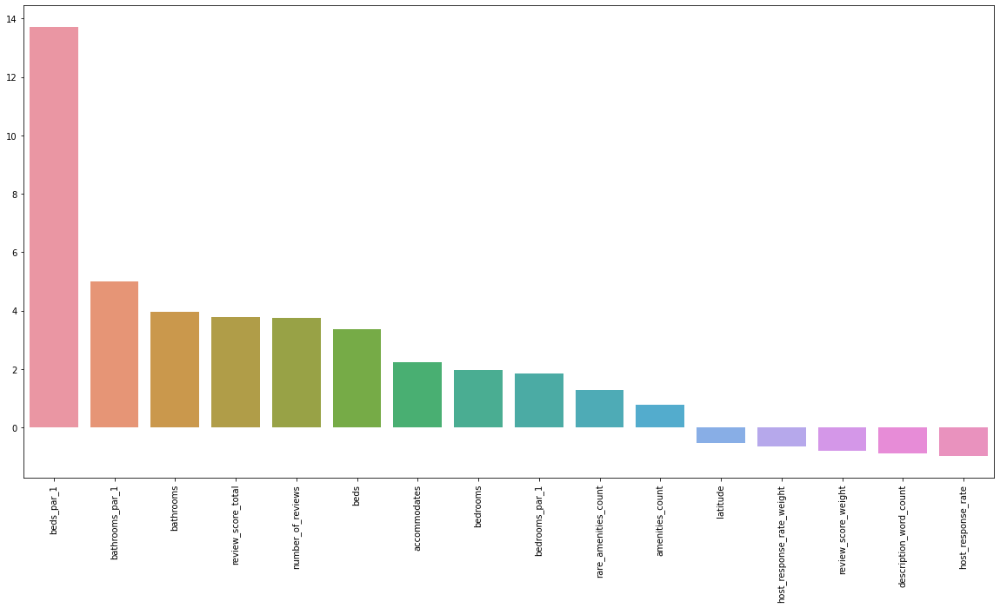

In [17]:
train_X_addEDA_log, num_col_feat_list, pt = gather_function.logarithmic_transformation(train_X_addEDA)

### カテゴリ変数化

In [21]:
#one-hot変換をせずにlabelencodingする → カテゴリ変数化
categorical_columns = ['neighbourhood']

In [22]:
train_X_addEDA_log_dummy = gather_function.process_categorical(train_X_addEDA_log, categorical_columns)

100%|████████████████████████████████████████████| 1/1 [00:00<00:00, 768.61it/s]


In [23]:
train_X_addEDA_log_dummy[train_X_addEDA_log_dummy.columns[:99]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55583 entries, 0 to 55582
Data columns (total 99 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   accommodates                         55583 non-null  int64   
 1   bathrooms                            55583 non-null  int64   
 2   bedrooms                             55583 non-null  int64   
 3   beds                                 55583 non-null  int64   
 4   host_response_rate                   55583 non-null  int64   
 5   latitude                             55583 non-null  float64 
 6   longitude                            55583 non-null  float64 
 7   neighbourhood                        55583 non-null  category
 8   number_of_reviews                    55583 non-null  int64   
 9   review_scores_rating                 43027 non-null  float64 
 10  thumbnail_url                        49438 non-null  float64 
 11  bathrooms_par_1

## 目的変数の前処理

歪度: 0.535099
尖度: 0.662021


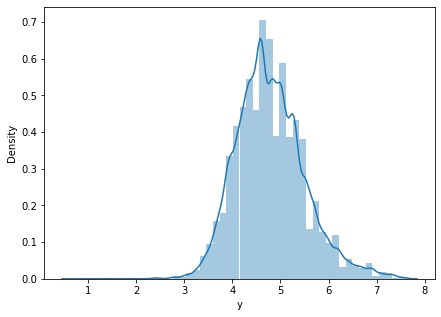

In [27]:
train_y_ac = train_y / train_X_addEDA_log_dummy["accommodates"]
#目的変数の対数log(x+1)をとる
train_y_ac_log = np.log1p(train_y_ac) #②
train_y_log = np.log1p(train_y) #③

#分布を可視化
plt.figure(figsize=(7, 5))
sns.distplot(train_y_log)

#歪度と尖度を計算
print("歪度: %f" % train_y_log.skew())
print("尖度: %f" % train_y_log.kurt())

## データセットの分割

In [30]:
presplit_train_X = train_X_addEDA_log_dummy
presplit_train_y = train_y

In [31]:

X_trainval, X_test, y_trainval, y_test = train_test_split(presplit_train_X, presplit_train_y, test_size=0.33, random_state=0)

歪度: 4.264338
尖度: 26.030945
歪度: 4.240694
尖度: 25.648410


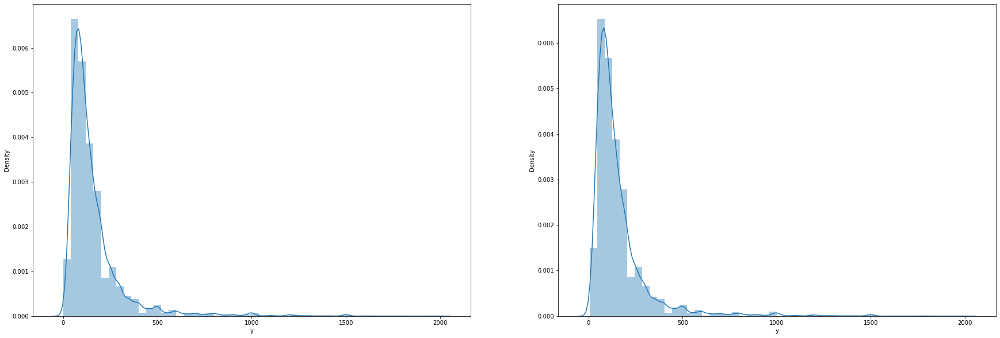

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[30, 10])

sns.distplot(train_y, ax=ax1)
#歪度と尖度を計算
print("歪度: %f" % train_y.skew())
print("尖度: %f" % train_y.kurt())

print('=============')

sns.distplot(y_trainval, ax=ax2)
#歪度と尖度を計算
print("歪度: %f" % y_trainval.skew())
print("尖度: %f" % y_trainval.kurt())

## パラメータチューニング

In [40]:
import optuna.integration.lightgbm as op_lgb

# LightGBM用のデータセットに変換
op_trainval = lgb.Dataset(X_trainval, y_trainval)

n_splits = 8

In [37]:
# ハイパーパラメータサーチ&モデル構築
op_params = {'objective': 'regression',
          'metric': 'rmse',
          'random_seed':0} 
# クロスバリデーションによるハイパーパラメータの探索 3fold
tuner = op_lgb.LightGBMTunerCV(op_params, op_trainval, verbose_eval=100, early_stopping_rounds=100, folds=KFold(n_splits=n_splits))

# ハイパーパラメータ探索の実行
tuner.run()

[I 2021-08-07 03:19:43,048] A new study created in memory with name: no-name-6d498cdf-befc-4b10-876c-d318385e513d
feature_fraction, val_score: inf:   0%|                   | 0/7 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.699829:  14%|5   | 1/7 [00:14<01:28, 14.70s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.372990:  29%|#1  | 2/7 [00:32<01:21, 16.37s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.372990:  43%|#7  | 3/7 [00:42<00:54, 13.65s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.372990:  57%|##2 | 4/7 [00:53<00:37, 12.59s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.372990:  71%|##8 | 5/7 [01:04<00:23, 11.87s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.372990:  86%|###4| 6/7 [01:16<00:12, 12.17s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 105.372990: 100%|####| 7/7 [01:28<00:00, 12.59s/it]


[400]	cv_agg's rmse: 107.557 + 3.73579


num_leaves, val_score: 105.372990:   0%|                 | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:   5%|4        | 1/20 [00:15<04:54, 15.51s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  10%|9        | 2/20 [00:33<05:08, 17.15s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  15%|#3       | 3/20 [00:52<05:04, 17.94s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006913 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  20%|#8       | 4/20 [01:09<04:38, 17.40s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  25%|##2      | 5/20 [01:27<04:25, 17.72s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  30%|##6      | 6/20 [01:46<04:16, 18.30s/it]

[300]	cv_agg's rmse: 106.311 + 3.2802
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And

num_leaves, val_score: 105.372990:  35%|###1     | 7/20 [02:01<03:42, 17.14s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  40%|###6     | 8/20 [02:13<03:05, 15.47s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  45%|####     | 9/20 [02:26<02:42, 14.76s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  50%|####    | 10/20 [02:43<02:32, 15.29s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  55%|####4   | 11/20 [02:59<02:21, 15.68s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  60%|####8   | 12/20 [03:14<02:03, 15.46s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.372990:  65%|#####2  | 13/20 [03:33<01:54, 16.30s/it]

[1000]	cv_agg's rmse: 109.259 + 3.42037
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007510 seconds.
You can set `force_row_wise=true` to remove the overhead.
A

num_leaves, val_score: 105.372990:  70%|#####6  | 14/20 [03:50<01:40, 16.70s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.329170:  75%|######  | 15/20 [04:07<01:23, 16.65s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.329170:  80%|######4 | 16/20 [04:23<01:05, 16.46s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006899 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.329170:  85%|######8 | 17/20 [04:39<00:49, 16.49s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.329170:  90%|#######2| 18/20 [04:54<00:32, 16.02s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 105.329170:  95%|#######6| 19/20 [05:08<00:15, 15.25s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:   0%|                    | 0/10 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  10%|#2          | 1/10 [00:10<01:37, 10.81s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  20%|##4         | 2/10 [00:22<01:28, 11.03s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  30%|###6        | 3/10 [00:30<01:08,  9.75s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  40%|####8       | 4/10 [00:41<01:02, 10.42s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  50%|######      | 5/10 [00:51<00:51, 10.23s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  60%|#######2    | 6/10 [01:00<00:39,  9.79s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  70%|########3   | 7/10 [01:08<00:27,  9.06s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  80%|#########6  | 8/10 [01:19<00:19,  9.69s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 105.329170:  90%|##########8 | 9/10 [01:32<00:10, 10.72s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 105.329170:   0%|     | 0/3 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 105.329170:  33%|3| 1/3 [00:11<00:22, 11.41s[I 2021-08-07 03:28:33,534] Trial 37 finished with value: 105.57726563060217 and parameters: {'feature_fraction': 0.48000000000000004}. Best is trial 37 with value: 105.57726563060217.
feature_fraction_stage2, val_score: 105.329170:  33%|3| 1/3 [00:11<00:22, 11.41s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 105.329170:  67%|6| 2/3 [00:24<00:12, 12.16s[I 2021-08-07 03:28:46,221] Trial 38 finished with value: 105.63436206357369 and parameters: {'feature_fraction': 0.44800000000000006}. Best is trial 37 with value: 105.57726563060217.
feature_fraction_stage2, val_score: 105.329170:  67%|6| 2/3 [00:24<00:12, 12.16s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 105.293731: 100%|#| 3/3 [00:38<00:00, 13.13s[I 2021-08-07 03:29:00,496] Trial 39 finished with value: 105.29373082901589 and parameters: {'feature_fraction': 0.41600000000000004}. Best is trial 39 with value: 105.29373082901589.
feature_fraction_stage2, val_score: 105.293731: 100%|#| 3/3 [00:38<00:00, 12.79s
regularization_factors, val_score: 105.293731:   0%|     | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:   5%| | 1/20 [00:15<04:49, 15.22s[I 2021-08-07 03:29:15,716] Trial 40 finished with value: 104.97962627522358 and parameters: {'lambda_l1': 8.778160112914599e-05, 'lambda_l2': 4.800431035647631}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:   5%| | 1/20 [00:15<04:49, 15.22s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008085 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  10%|1| 2/20 [00:27<03:59, 13.31s[I 2021-08-07 03:29:27,697] Trial 41 finished with value: 105.16654277255785 and parameters: {'lambda_l1': 0.008744045878805196, 'lambda_l2': 0.024090996381733943}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  10%|1| 2/20 [00:27<03:59, 13.31s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  15%|1| 3/20 [00:39<03:41, 13.00s[I 2021-08-07 03:29:40,330] Trial 42 finished with value: 105.31370350102513 and parameters: {'lambda_l1': 0.01075904503263399, 'lambda_l2': 0.001104667032477169}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  15%|1| 3/20 [00:39<03:41, 13.00s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  20%|2| 4/20 [00:56<03:50, 14.43s[I 2021-08-07 03:29:56,939] Trial 43 finished with value: 105.2417616354108 and parameters: {'lambda_l1': 1.627258880527339e-06, 'lambda_l2': 1.66877692928017e-05}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  20%|2| 4/20 [00:56<03:50, 14.43s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  25%|2| 5/20 [01:16<04:07, 16.50s[I 2021-08-07 03:30:17,104] Trial 44 finished with value: 105.44629178048585 and parameters: {'lambda_l1': 3.8012383235392156e-06, 'lambda_l2': 0.01953698430878042}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  25%|2| 5/20 [01:16<04:07, 16.50s

[400]	cv_agg's rmse: 105.575 + 3.5992
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And

regularization_factors, val_score: 104.979626:  30%|3| 6/20 [01:31<03:41, 15.84s[I 2021-08-07 03:30:31,678] Trial 45 finished with value: 105.23732029963801 and parameters: {'lambda_l1': 9.798138774028191e-06, 'lambda_l2': 0.032821420282695}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  30%|3| 6/20 [01:31<03:41, 15.84s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  35%|3| 7/20 [01:46<03:22, 15.60s[I 2021-08-07 03:30:46,780] Trial 46 finished with value: 105.31025299868669 and parameters: {'lambda_l1': 0.0007519099751392732, 'lambda_l2': 0.0009893679573683182}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  35%|3| 7/20 [01:46<03:22, 15.60s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  40%|4| 8/20 [02:02<03:08, 15.68s[I 2021-08-07 03:31:02,625] Trial 47 finished with value: 105.36402681781435 and parameters: {'lambda_l1': 1.31433378072909e-08, 'lambda_l2': 0.03146858727988046}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  40%|4| 8/20 [02:02<03:08, 15.68s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  45%|4| 9/20 [02:15<02:45, 15.03s[I 2021-08-07 03:31:16,221] Trial 48 finished with value: 105.36515735721454 and parameters: {'lambda_l1': 2.973821733540877, 'lambda_l2': 0.007077946268676528}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  45%|4| 9/20 [02:15<02:45, 15.03s

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  50%|5| 10/20 [02:32<02:34, 15.43[I 2021-08-07 03:31:32,537] Trial 49 finished with value: 105.73093007628063 and parameters: {'lambda_l1': 1.248817491496872e-07, 'lambda_l2': 0.008207486415506832}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  50%|5| 10/20 [02:32<02:34, 15.43

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  55%|5| 11/20 [02:45<02:12, 14.70[I 2021-08-07 03:31:45,609] Trial 50 finished with value: 105.49613354213982 and parameters: {'lambda_l1': 2.9746441760070828, 'lambda_l2': 8.063908622884737}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  55%|5| 11/20 [02:45<02:12, 14.70

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006709 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  60%|6| 12/20 [03:01<02:00, 15.09[I 2021-08-07 03:32:01,575] Trial 51 finished with value: 105.34357285886277 and parameters: {'lambda_l1': 0.020686990572347942, 'lambda_l2': 3.973863558300362}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  60%|6| 12/20 [03:01<02:00, 15.09

[300]	cv_agg's rmse: 105.422 + 3.22396
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006024 seconds.
You can set `force_row_wise=true` to remove the overhead.
An

regularization_factors, val_score: 104.979626:  65%|6| 13/20 [03:19<01:51, 15.99[I 2021-08-07 03:32:19,648] Trial 52 finished with value: 105.42793940336048 and parameters: {'lambda_l1': 0.0002491734275845352, 'lambda_l2': 0.9782657040857258}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  65%|6| 13/20 [03:19<01:51, 15.99

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  70%|7| 14/20 [03:33<01:32, 15.35[I 2021-08-07 03:32:33,506] Trial 53 finished with value: 105.30614485069165 and parameters: {'lambda_l1': 0.060757796726250986, 'lambda_l2': 6.193912767526228e-08}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  70%|7| 14/20 [03:33<01:32, 15.35

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007931 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  75%|7| 15/20 [03:46<01:13, 14.66[I 2021-08-07 03:32:46,565] Trial 54 finished with value: 105.56527236441528 and parameters: {'lambda_l1': 0.000181608027075161, 'lambda_l2': 0.41633473513033076}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  75%|7| 15/20 [03:46<01:13, 14.66

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  80%|8| 16/20 [04:01<00:59, 14.76[I 2021-08-07 03:33:01,565] Trial 55 finished with value: 105.2746089302739 and parameters: {'lambda_l1': 0.0023350308682301285, 'lambda_l2': 1.1155871048064337e-05}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  80%|8| 16/20 [04:01<00:59, 14.76

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  85%|8| 17/20 [04:16<00:44, 14.99[I 2021-08-07 03:33:17,085] Trial 56 finished with value: 105.42624810586514 and parameters: {'lambda_l1': 0.24166687851686072, 'lambda_l2': 0.7000259471238965}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  85%|8| 17/20 [04:16<00:44, 14.99

[300]	cv_agg's rmse: 105.665 + 3.40635
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005379 seconds.
You can set `force_row_wise=true` to remove the overhead.
An

regularization_factors, val_score: 104.979626:  90%|9| 18/20 [04:29<00:28, 14.23[I 2021-08-07 03:33:29,549] Trial 57 finished with value: 105.2545838595392 and parameters: {'lambda_l1': 2.5225179539630782e-05, 'lambda_l2': 5.6709815312248475e-05}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  90%|9| 18/20 [04:29<00:28, 14.23

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626:  95%|9| 19/20 [04:43<00:14, 14.44[I 2021-08-07 03:33:44,483] Trial 58 finished with value: 105.34246179363699 and parameters: {'lambda_l1': 8.368985919535625e-05, 'lambda_l2': 0.16169111360486985}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626:  95%|9| 19/20 [04:43<00:14, 14.44

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 104.979626: 100%|#| 20/20 [04:57<00:00, 14.09[I 2021-08-07 03:33:57,741] Trial 59 finished with value: 105.63391946411497 and parameters: {'lambda_l1': 0.33809337476232615, 'lambda_l2': 9.770100451774528}. Best is trial 40 with value: 104.97962627522358.
regularization_factors, val_score: 104.979626: 100%|#| 20/20 [04:57<00:00, 14.86
min_data_in_leaf, val_score: 104.979626:   0%|            | 0/5 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 104.979626:  20%|8   | 1/5 [00:13<00:54, 13.50s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 104.979626:  40%|#6  | 2/5 [00:31<00:48, 16.24s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 104.979626:  60%|##4 | 3/5 [00:49<00:33, 16.82s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 104.979626:  80%|###2| 4/5 [01:01<00:15, 15.17s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6809
[LightGBM] [Info] Number of data points in the train set: 32585, number of used features: 190
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006899 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 104.979626: 100%|####| 5/5 [01:19<00:00, 15.89s/it]


In [38]:
# サーチしたパラメータの表示
best_params = tuner.best_params
print("  Params: ")
for key, value in best_params.items():
    print("    {}: {}".format(key, value))

  Params: 
    objective: regression
    metric: rmse
    random_seed: 0
    feature_pre_filter: False
    lambda_l1: 8.778160112914599e-05
    lambda_l2: 4.800431035647631
    num_leaves: 74
    feature_fraction: 0.41600000000000004
    bagging_fraction: 1.0
    bagging_freq: 0
    min_child_samples: 20


## 学習

In [41]:
#チューニングしたパラメータで再度学習と予測をする
y_preds = []
models = []
oof_train = np.zeros((len(X_trainval), ))

kfolds = KFold(n_splits=n_splits, shuffle=True, random_state=0)

test_preds = np.zeros(X_test.shape[0])

evaluation_results_list = []

In [42]:
for fold_id, (train_cv_no, eval_cv_no) in enumerate(kfolds.split(X_trainval)):
    train_x_cv = X_trainval.iloc[train_cv_no, :]
    train_y_cv = y_trainval.iloc[train_cv_no]
    val_x_cv = X_trainval.iloc[eval_cv_no, :]
    val_y_cv = y_trainval.iloc[eval_cv_no]
    
    lgb_train = lgb.Dataset(train_x_cv, train_y_cv) #(DataFrame, Series)
    lgb_valid = lgb.Dataset(val_x_cv, val_y_cv, reference=lgb_train) #(DataFrame, Series)
    
    params = {
        "objective":"regression",
        "metric":"rmse",
        "verbose":1000,
        "random_seed":0,
        'learning_rate': 0.001,
    }
    params.update(best_params)
    params['num_leaves'] = int(best_params['num_leaves'])
    params['min_child_samples'] = int(best_params['min_child_samples'])
    params['bagging_freq'] = int(best_params['bagging_freq'])
    print(params)
    
    FIT_PARAMS_LGB = {"num_boost_round": 10000, "early_stopping_rounds": 1000,}

    evaluation_results  = {}  # to record evaluation results for plotting
    model = lgb.train(params, 
                  lgb_train,
                   **FIT_PARAMS_LGB,
                  valid_names=['train', 'valid'], 
                  valid_sets=[lgb_train, lgb_valid],
                 evals_result = evaluation_results,)
    
    oof_train[eval_cv_no] = model.predict(val_x_cv, num_iteration=model.best_iteration)
    y_pred = model.predict(X_test, num_iteration=model.best_iteration)
    y_preds.append(y_pred)
    models.append(model)
    evaluation_results_list.append(evaluation_results)
    
    #submit用の予測をする。Fold数で割って平均値を算出する。
    test_preds += model.predict(X_test, num_iteration=model.best_iteration)
    
test_preds = test_preds / kfolds.n_splits

{'objective': 'regression', 'metric': 'rmse', 'verbose': 1000, 'random_seed': 0, 'learning_rate': 0.001, 'feature_pre_filter': False, 'lambda_l1': 8.778160112914599e-05, 'lambda_l2': 4.800431035647631, 'num_leaves': 74, 'feature_fraction': 0.41600000000000004, 'bagging_fraction': 1.0, 'bagging_freq': 0, 'min_child_samples': 20}
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.953308
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.638163
[LightGBM] [Debug] init for col-wise cost 0.007409 seconds, init for row-wise cost 0.009000 seconds
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008924 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin
[LightGBM] [Info] Total Bins 6784
[LightGBM] [Info] Number

In [43]:
scores = [
    m.best_score['valid']['rmse'] for m in models
]
score = sum(scores) / len(scores)
print('=== CV score ===')
print(scores)
print(score)

=== CV score ===
[108.07828776963295, 101.65875179624699, 99.94568596702327, 100.8707468798387, 105.99807254479514, 109.97904699030704, 102.94636926534469, 108.67919206231828]
104.76951915943836


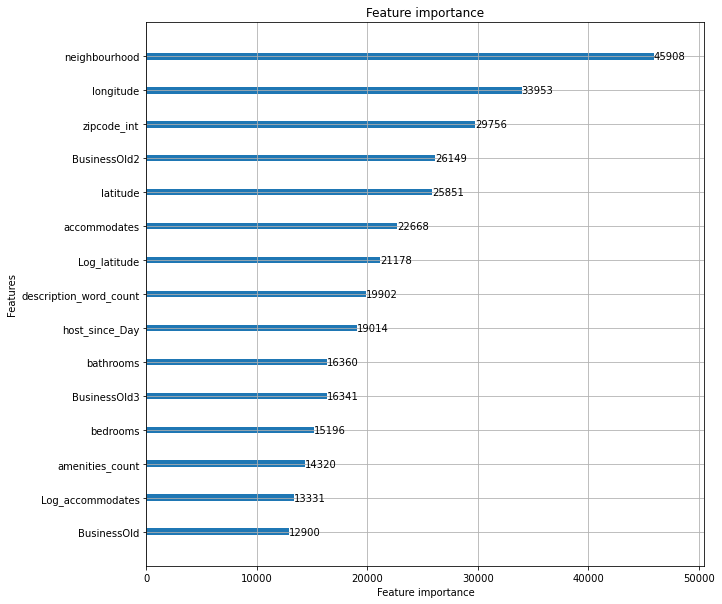

In [44]:
#特徴量の重要度を可視化
lgb.plot_importance(model, max_num_features=15, figsize=(10,10))
plt.show()

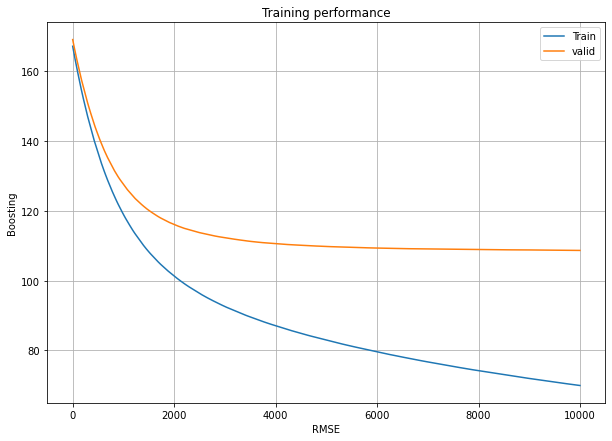

In [45]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot()
ax.plot(evaluation_results['train']['rmse'], label='Train')
ax.plot(evaluation_results['valid']['rmse'], label='valid')
ax.set_xlabel("RMSE")
ax.set_ylabel("Boosting")
ax.set_title('Training performance')
plt.grid()
plt.legend()
plt.show()

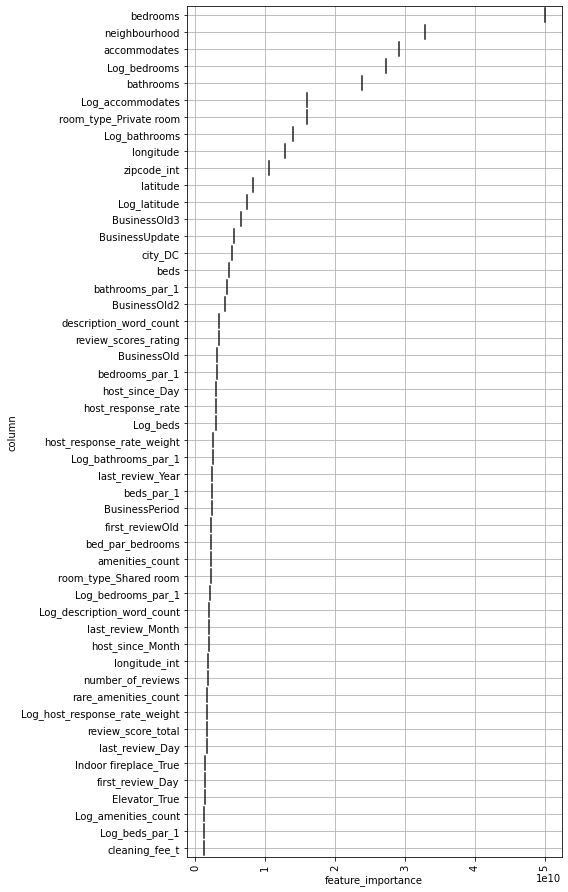

In [46]:
top_n=50
feature_importance_df = pd.DataFrame()

_df = pd.DataFrame()
_df['feature_importance'] = model.feature_importance(importance_type='gain')
_df['column'] = train_x_cv.columns
feature_importance_df = pd.concat([feature_importance_df, _df], axis=0, ignore_index=True)

order = feature_importance_df.groupby('column').sum()[['feature_importance']].sort_values('feature_importance', ascending=False).index[:top_n]

fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
sns.boxenplot(data=feature_importance_df,
              x='feature_importance',
              y='column',
              order=order,
              ax=ax,
              palette='viridis',
              orient='h')
ax.tick_params(axis='x', rotation=90)
ax.tick_params(axis='x', rotation=90)
ax.grid()
fig.tight_layout()

# モデルの推論結果

In [47]:
pd.Series(test_preds)

0        139.808720
1        164.850648
2        115.507483
3        103.420546
4        195.110446
            ...    
18338     80.067180
18339     19.593040
18340     84.452657
18341    115.429036
18342    163.282633
Length: 18343, dtype: float64

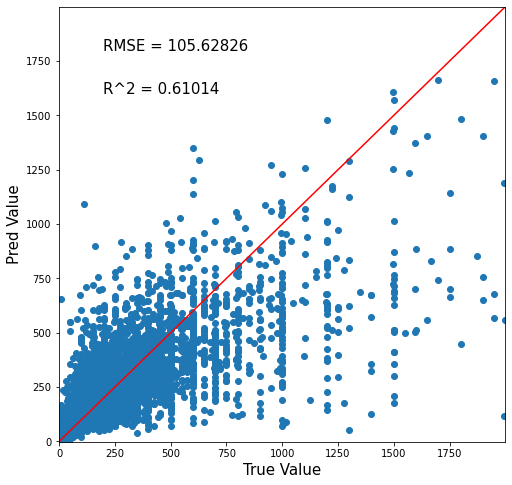

In [48]:
pred_df = pd.concat([y_test.reset_index(drop=True), pd.Series(test_preds)], axis=1)
pred_df.columns = ['true', 'pred']
# 可視化
gather_function.True_Pred_map(pred_df)

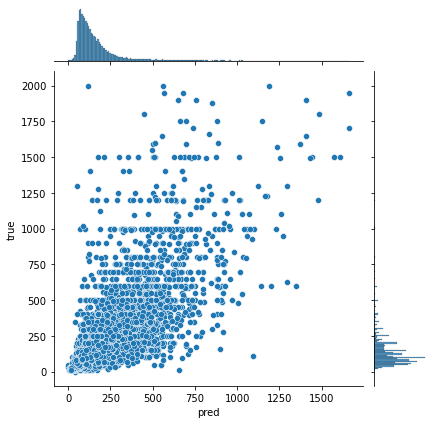

In [49]:
sns.jointplot(data=pred_df, x="pred", y="true")

In [54]:
y_pred = pd.Series(models[2].predict(X_test, num_iteration=models[2].best_iteration))
y_pred

0        145.409408
1        171.039738
2        116.987421
3        103.709761
4        191.687545
            ...    
18338     79.588184
18339     15.680326
18340     86.870204
18341    114.386854
18342    163.119344
Length: 18343, dtype: float64

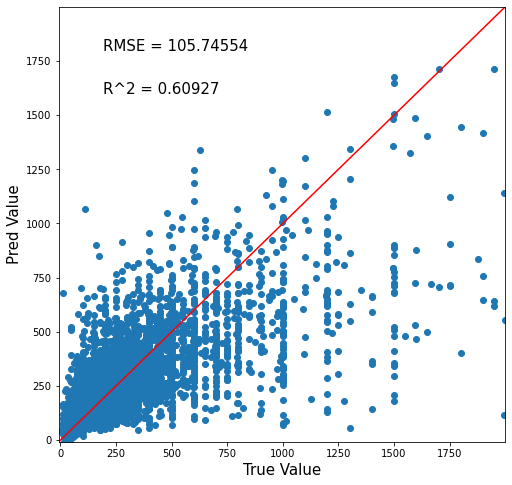

In [56]:
pred_df = pd.concat([y_test.reset_index(drop=True), y_pred], axis=1)
pred_df.columns = ['true', 'pred']
# 可視化
gather_function.True_Pred_map(pred_df)

### 対数戻す

In [64]:
pd.Series(np.exp(test_preds) )

0         98.981284
1        114.072625
2        100.913783
3         87.252118
4        199.458148
            ...    
13891    153.513503
13892     56.520311
13893    336.908099
13894    288.560918
13895     61.390139
Length: 13896, dtype: float64

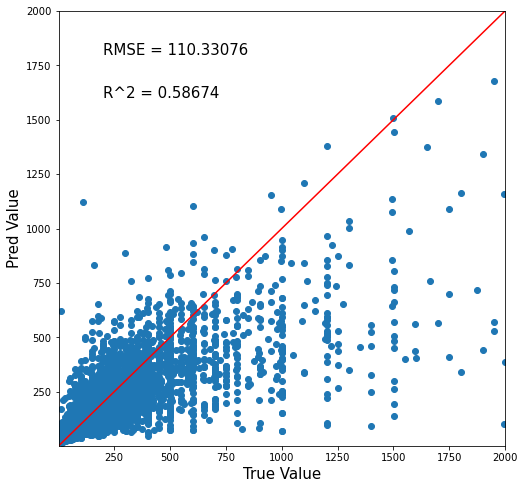

In [65]:
pred_df = pd.concat([np.exp(y_test).reset_index(drop=True), pd.Series(np.exp(test_preds) )], axis=1)
pred_df.columns = ['true', 'pred']
# 可視化
True_Pred_map(pred_df)

# サブミット

## テストデータ

In [118]:
test.head()

,accommodates,amenities,bathrooms,bed_type,bedrooms,beds,cancellation_policy,city,cleaning_fee,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,property_type,review_scores_rating,room_type,thumbnail_url,zipcode
0,6,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",2.0,Real Bed,2.0,2.0,strict,Boston,t,Feel free to book INSTANTLY. You can check-in ...,2017-01-09,t,f,100%,2016-08-23,t,2017-09-25,42.359278,-71.069962,Gorgeous 2BR/2BA Duplex in Beacon Hill,Beacon Hill,58,House,90.0,Entire home/apt,https://a0.muscache.com/im/pictures/7e4808b4-5...,02114
1,3,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1.0,Real Bed,1.0,1.0,moderate,LA,t,The guest house is close to: Equinox West Holl...,2016-08-17,t,t,100%,2014-09-03,f,2017-05-02,34.084747,-118.367355,Luxury 1 Bedroom West Hollywood City Center,West Hollywood,4,Guesthouse,100.0,Entire home/apt,https://a0.muscache.com/im/pictures/5392fbd6-6...,90046
2,2,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",1.0,Real Bed,0.0,1.0,flexible,NYC,f,Private room in a three bedroom apartment in N...,NaN,t,t,100%,2012-10-17,f,NaN,40.720541,-73.959192,Bedroom with Patio in Prime Williamsburg Locat...,Williamsburg,0,Apartment,NaN,Private room,https://a0.muscache.com/im/pictures/544d3b89-d...,11249.0
3,4,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1.0,Real Bed,1.0,2.0,strict,NYC,f,The apartment is located in historic Bed Stuy ...,NaN,t,t,NaN,2013-01-23,f,NaN,40.681117,-73.944091,Cozy apartment in Brooklyn,Bedford-Stuyvesant,0,Apartment,NaN,Entire home/apt,https://a0.muscache.com/im/pictures/26baf7ba-0...,11216
4,3,"{TV,Internet,""Wireless Internet"",""Air conditio...",1.5,Real Bed,1.0,2.0,strict,LA,t,"Our cozy, pet friendly one bedroom apartment/l...",2015-08-01,t,t,100%,2014-12-28,f,2016-09-11,34.150995,-118.409359,"Cozy, sunny, pet friendly loft/apt",NaN,6,Loft,92.0,Entire home/apt,https://a0.muscache.com/im/pictures/86107545/9...,91604


## 前処理

In [125]:
df_ori_test, _ = gather_function.preprocessing(test, max_amenities_list)

max_amenities_list : 更新


100%|███████████████████████████████████████████| 86/86 [00:02<00:00, 31.88it/s]


In [126]:
df_ori_test.head()

,accommodates,bathrooms,bed_type,bedrooms,beds,cancellation_policy,city,cleaning_fee,host_has_profile_pic,host_identity_verified,host_response_rate,instant_bookable,latitude,longitude,neighbourhood,number_of_reviews,property_type,review_scores_rating,room_type,thumbnail_url,bathrooms_par_1,bedrooms_par_1,beds_par_1,bed_par_bedrooms,latitude_int,longitude_int,review_score_total,review_score_weight,amenities_count,TV,Cable TV,Wireless Internet,Air conditioning,Kitchen,Free parking on premises,Pets allowed,Breakfast,Elevator,Hot tub,Indoor fireplace,Heating,Family/kid friendly,Suitable for events,Washer,Dryer,Smoke detector,Carbon monoxide detector,First aid kit,Safety card,Fire extinguisher,Essentials,Shampoo,Lock on bedroom door,Hangers,Hair dryer,Iron,Laptop friendly workspace,Self Check-In,Keypad,Private entrance,Baby monitor,Bathtub,Baby bath,Changing table,Children’s books and toys,Window guards,Table corner guards,Fireplace guards,Babysitter recommendations,Crib,Room-darkening shades,Game console,Hot water,Bed linens,Extra pillows and blankets,Ethernet connection,Pocket wifi,Microwave,Coffee maker,Refrigerator,Dishwasher,Dishes and silverware,Cooking basics,Oven,Stove,EV charger,Single level home,BBQ grill,Patio or balcony,Garden or backyard,Beach essentials,Luggage dropoff allowed,Long term stays allowed,Wide hallway clearance,Step-free access,Wide doorway,Flat,smooth pathway to front door,Well-lit path to entrance,Disabled parking spot,Wide clearance to bed,Accessible-height bed,Fixed grab bars for shower & toilet,Bathtub with shower chair,Roll-in shower with chair,Accessible-height toilet,Wide clearance to shower & toilet,Wide entryway,Waterfront,Handheld shower head,rare_amenities_count,description_word_count,host_response_rate_weight,first_review_Year,first_review_Month,first_review_Day,BusinessOld,host_since_Year,host_since_Month,host_since_Day,BusinessOld2,first_reviewOld,last_review_Year,last_review_Month,last_review_Day,BusinessOld3,BusinessUpdate,BusinessPeriod,zipcode_int
0,6,2,Real Bed,2,2,strict,Boston,t,t,f,100,t,42.359278,-71.069962,Beacon Hill,58,House,90.0,Entire home/apt,1.0,0.333333,0.333333,0.333333,1.0,42,-71,5220.0,0.569620,21,True,True,True,True,True,False,False,False,False,False,True,True,True,False,True,True,True,True,False,False,False,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,24,1000,63.291139,2017.0,1.0,9.0,2975.0,2016.0,8.0,23.0,3095.0,139.0,2017.0,9.0,25.0,3234.0,1557.0,259.0,2114
1,3,1,Real Bed,1,1,moderate,LA,t,t,t,100,f,34.084747,-118.367355,West Hollywood,4,Guesthouse,100.0,Entire home/apt,1.0,0.333333,0.333333,0.333333,1.0,34,-118,400.0,0.961538,20,True,True,True,True,True,True,False,False,False,False,False,True,False,False,False,False,True,True,False,False,True,True,True,False,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,24,1000,96.153846,2016.0,8.0,17.0,2830.0,2014.0,9.0,3.0,2375.0,714.0,2017.0,5.0,2.0,3088.0,1703.0,258.0,90046
2,2,1,Real Bed,0,1,flexible,NYC,f,t,t,100,f,40.720541,-73.959192,Williamsburg,0,Apartment,NaN,Private room,1.0,0.500000,0.000000,0.500000,0.0,40,-73,0.0,0.000000,10,True,False,True,True,True,False,False,False,False,False,False,True,True,False,True,True,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

## ダミー変数化

In [137]:
def fit_LabelEncoding(categorical_columns, training_df, Test_df):
    
    for column in tqdm(categorical_columns):
        df = Test_df.copy()
        le_column = LabelEncoder().fit(training_df[column].fillna('Na'))
        mask = df[column].isin(le_column.classes_)
        column_new_data = df[column].mask(mask).unique()
        le_column.classes_ = np.concatenate([le_column.classes_, column_new_data])
        df[column] = le_column.transform(df[column])
        
    df[categorical_columns] = df[categorical_columns].astype('category')

    return df

def fit_dummy(categorical_columns, training_df, Test_df):
    df = Test_df.copy()
    fit_dummy_columns = []
    for i in training_df.select_dtypes(include=object).columns.tolist():
        if i not in categorical_columns:
            fit_dummy_columns.append(i)
            
    for column in tqdm(training_df[fit_dummy_columns].columns):
        fit_type = training_df[column].dropna().unique()
        #NA = training_df[column].value_counts(dropna=False).index[0]
        df[column] = pd.Categorical(df[column], fit_type)
        
    df = pd.get_dummies(df, columns=fit_dummy_columns, drop_first=True)
    return df

In [138]:
df_ori_test_dummy = fit_LabelEncoding(categorical_columns, train_X_addEDA, df_ori_test)
df_ori_test_dummy = fit_dummy(categorical_columns, train_X_addEDA, df_ori_test_dummy)

100%|███████████████████████████████████████████| 90/90 [00:01<00:00, 61.03it/s]


In [141]:
df_ori_test_dummy.head()

,accommodates,bathrooms,bedrooms,beds,host_response_rate,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,bathrooms_par_1,bedrooms_par_1,beds_par_1,bed_par_bedrooms,latitude_int,longitude_int,review_score_total,review_score_weight,amenities_count,rare_amenities_count,description_word_count,host_response_rate_weight,first_review_Year,first_review_Month,first_review_Day,BusinessOld,host_since_Year,host_since_Month,host_since_Day,BusinessOld2,first_reviewOld,last_review_Year,last_review_Month,last_review_Day,BusinessOld3,BusinessUpdate,BusinessPeriod,zipcode_int,bed_type_Pull-out Sofa,bed_type_Airbed,bed_type_Futon,bed_type_Couch,cancellation_policy_strict,cancellation_policy_moderate,cancellation_policy_super_strict_30,cancellation_policy_super_strict_60,city_DC,city_NYC,city_SF,city_Chicago,city_Boston,cleaning_fee_f,host_has_profile_pic_Na,host_has_profile_pic_f,host_identity_verified_t,host_identity_verified_Na,instant_bookable_t,property_type_House,property_type_Townhouse,property_type_Loft,property_type_Cabin,property_type_Condominium,property_type_Guest suite,property_type_Guesthouse,property_type_Other,property_type_Bungalow,property_type_Villa,property_type_Bed & Breakfast,property_type_Dorm,property_type_Timeshare,property_type_Camper/RV,property_type_Cave,property_type_Hostel,property_type_Earth House,property_type_In-law,property_type_Serviced apartment,property_type_Boat,property_type_Tent,property_type_Castle,property_type_Boutique hotel,property_type_Vacation home,property_type_Hut,property_type_Treehouse,property_type_Yurt,property_type_Chalet,property_type_Island,property_type_Tipi,property_type_Train,property_type_Parking Space,property_type_Casa particular,room_type_Entire home/apt,room_type_Shared room,TV_False,Cable TV_True,Wireless Internet_False,Air conditioning_True,Kitchen_False,Free parking on premises_False,Pets allowed_True,Breakfast_True,Elevator_True,Hot tub_True,Indoor fireplace_True,Heating_True,Family/kid friendly_True,Suitable for events_True,Washer_False,Dryer_False,Smoke detector_False,Carbon monoxide detector_True,First aid kit_True,Safety card_True,Fire extinguisher_True,Essentials_True,Shampoo_True,Lock on bedroom door_True,Hangers_True,Hair dryer_True,Iron_True,Laptop friendly workspace_True,Self Check-In_True,Keypad_True,Private entrance_True,Baby monitor_True,Bathtub_True,Baby bath_True,Changing table_True,Children’s books and toys_True,Window guards_True,Table corner guards_True,Fireplace guards_True,Babysitter recommendations_True,Crib_True,Room-darkening shades_True,Game console_True,Hot water_True,Bed linens_True,Extra pillows and blankets_True,Ethernet connection_True,Pocket wifi_True,Microwave_True,Coffee maker_True,Refrigerator_True,Dishwasher_True,Dishes and silverware_True,Cooking basics_True,Oven_True,Stove_True,EV charger_True,Single level home_True,BBQ grill_True,Patio or balcony_True,Garden or backyard_True,Beach essentials_True,Luggage dropoff allowed_True,Long term stays allowed_True,Wide hallway clearance_True,Step-free access_True,Wide doorway_True,Flat_True,smooth pathway to front door_True,Well-lit path to entrance_True,Disabled parking spot_True,Wide clearance to bed_True,Accessible-height bed_True,Fixed grab bars for shower & toilet_True,Bathtub with shower chair_True,Roll-in shower with chair_True,Accessible-height toilet_True,Wide clearance to shower & toilet_True,Wide entryway_True,Waterfront_True,Handheld shower head_True
0,6,2,2,2,100,42.359278,-71.069962,40,58,90.0,1.0,0.333333,0.333333,0.333333,1.0,42,-71,5220.0,0.569620,21,24,1000,63.291139,2017.0,1.0,9.0,2975.0,2016.0,8.0,23.0,3095.0,139.0,2017.0,9.0,25.0,3234.0,1557.0,259.0,2114,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3,1,1,1,100,34.084747,-118

In [142]:
#こっちは普通にKFold
sub_preds = np.zeros(df_ori_test_dummy.shape[0])
for m in models:
    sub_preds += m.predict(df_ori_test_dummy, num_iteration=model.best_iteration)
sub_preds = sub_preds / kfolds.n_splits
# sub_preds = np.exp(sub_preds)

In [143]:
sub_preds

array([193.58521257,  98.95037251, 167.80471764, ..., 108.83650881,
        85.19759507,  44.5286883 ])

# Submit

In [145]:
#submit用のCSVを作成
sub = pd.DataFrame({"id":original_test_data['id'], "y":sub_preds})
print('sub["y"].isnull().sum()=', sub['y'].isnull().sum())
sub

sub["y"].isnull().sum()= 0


,id,y
0,0,193.585213
1,1,98.950373
2,2,167.804718
3,3,155.442357
4,4,75.388495
...,...,...
18523,18523,193.488617
18524,18524,84.409860
18525,18525,108.836509
18526,18526,85.197595


In [147]:
sub.to_csv('third_submission.csv', header=False, index=False)